# Import necessary libraries

In [26]:
import os
import glob
import torch
import cv2
import random
from tqdm import tqdm
import numpy as np
from torch import nn
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision.transforms import v2
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split

In [27]:
torch.manual_seed(42)

In [28]:
# Get cpu, gpu or mps device for training.
device = (
    "cuda:1"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Using {device} device")

Using cuda:1 device


In [29]:
mask_paths = glob.glob('./lgg-mri-segmentation/kaggle_3m/*/*_mask*')
image_paths = [i.replace('_mask', '') for i in mask_paths]
print(f'{len(mask_paths)} {len(image_paths)}')

3929 3929


# Helper functions

In [30]:
def plot_from_img_path(n_examples, list_img_paths, list_mask_paths):
    
    fig, axs = plt.subplots(n_examples, 3, figsize=(20, n_examples*7), constrained_layout=True)
    i = 0
    for ax in axs:
        image, mask = list_img_paths[i], list_mask_paths[i]
        image, mask = cv2.imread(image), cv2.imread(mask)
        ax[0].set_title("MRI images")
        ax[0].imshow(image)
        ax[1].set_title("Highlited abnormality")
        ax[1].imshow(image)
        ax[1].imshow(mask, alpha=0.2)
        ax[2].imshow(mask)
        ax[2].set_title("Abnormality mask")
        i += 1
 

# Visualizing images and masks

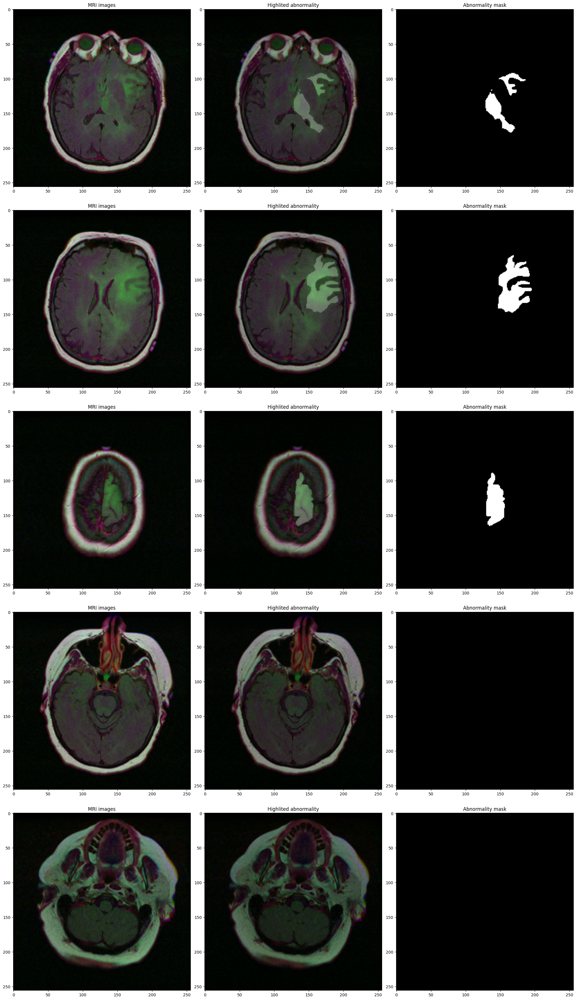

In [31]:
plot_from_img_path(n_examples=5, list_img_paths=image_paths[5:], list_mask_paths=mask_paths[5:])

# Create dataframe and split dataset into train, val and test sets

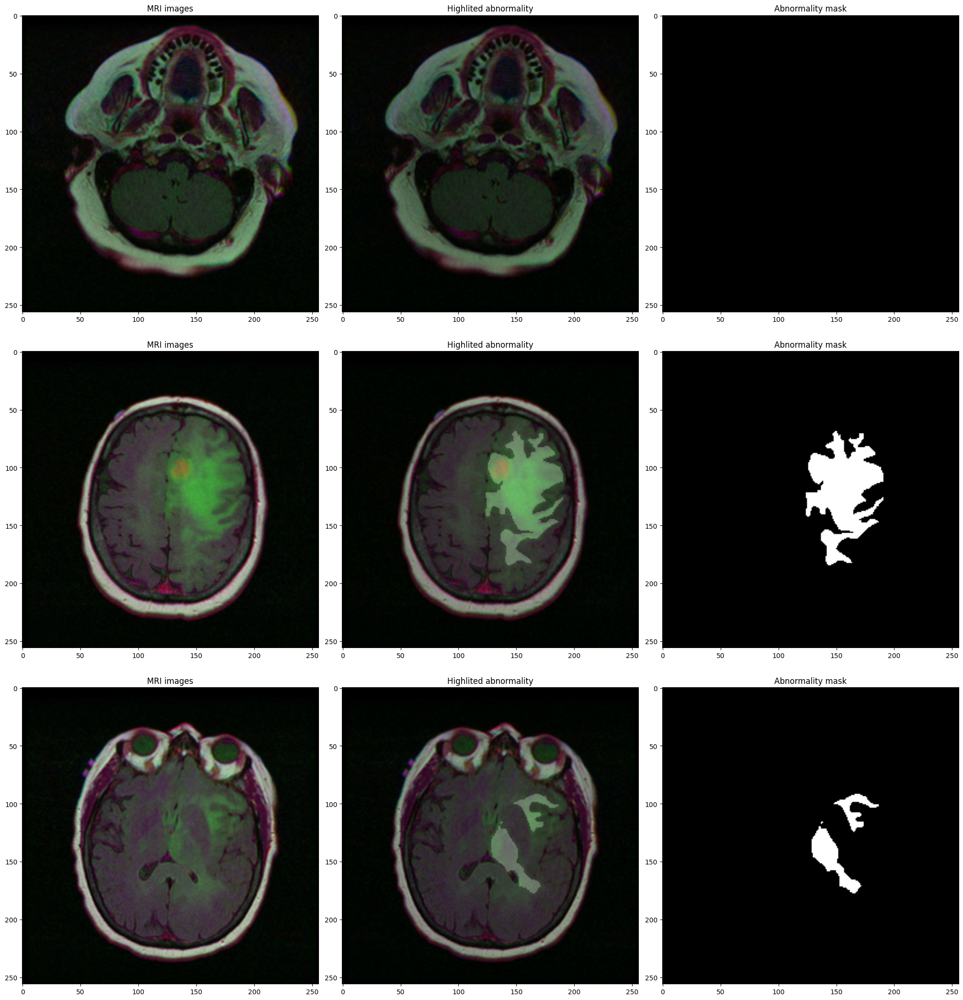

In [32]:
df = pd.DataFrame(data={'image': image_paths, 'mask': mask_paths})
df.head()
plot_from_img_path(n_examples=3, list_img_paths=df.iloc[[3,4,5],0].tolist(), list_mask_paths=df.iloc[[3,4,5],1].tolist())

In [33]:
df_train, df_test = train_test_split(df, test_size=0.3, random_state=42)  # 70% train, 30% test+val
df_test, df_val = train_test_split(df_test, test_size=0.5, random_state=42)  # 15% test, 15% val

print('train')
print(f"{df_train.describe().loc['count', ['image', 'mask']]}\n")
print('val')
print(f"{df_val.describe().loc['count', ['image', 'mask']]}\n")
print('test')
print(f"{df_test.describe().loc['count', ['image', 'mask']]}\n")

train
image    2750
mask     2750
Name: count, dtype: object

val
image    590
mask     590
Name: count, dtype: object

test
image    589
mask     589
Name: count, dtype: object



In [34]:
class MRI_Dataset(Dataset):
    def __init__(self, df, img_transform=None, mask_transform=None):
        self.image_paths = df['image']
        self.mask_paths = df['mask']
        self.img_transform = img_transform
        self.mask_transform = mask_transform
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_file = self.image_paths.iloc[idx]
        mask_file = self.mask_paths.iloc[idx]
        
        img = cv2.imread(img_file, cv2.IMREAD_UNCHANGED)
        mask = cv2.imread(mask_file, cv2.IMREAD_GRAYSCALE)

        if self.img_transform:
            img = self.img_transform(img)
        if self.mask_transform:
            mask = self.mask_transform(mask)
        
        return img, mask

In [35]:
train_img_transform = v2.Compose([
    v2.ToTensor(),
    v2.ToDtype(torch.float32, scale=True),
])
train_mask_transform = v2.Compose([
    v2.ToTensor(),
    v2.ToDtype(torch.float32, scale=True),
])

/home/csegpuserver/.local/lib/python3.10/site-packages/torchvision/transforms/v2/_deprecated.py:42: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.Output is equivalent up to float precision.
  warnings.warn(


In [36]:
val_img_transform = v2.Compose([
    v2.ToTensor(),
    v2.ToDtype(torch.float32, scale=True),
])
val_mask_transform = v2.Compose([
    v2.ToTensor(),
    v2.ToDtype(torch.float32, scale=True),
])

In [37]:
test_img_transform = v2.Compose([
    v2.ToTensor(),
    v2.ToDtype(torch.float32, scale=True),
])
test_mask_transform = v2.Compose([
    v2.ToTensor(),
    v2.ToDtype(torch.float32, scale=True),
])

In [38]:
train_dataset = MRI_Dataset(df_train, img_transform=train_img_transform, mask_transform=train_mask_transform)
val_dataset = MRI_Dataset(df_val, img_transform=val_img_transform, mask_transform=val_mask_transform)
test_dataset = MRI_Dataset(df_test, img_transform=test_img_transform, mask_transform=test_mask_transform)

In [39]:
batch_size = 16

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size)

In [40]:
for img, mask in train_dataloader:
    print(img.shape)
    print(mask.shape)
    break

torch.Size([16, 3, 256, 256])
torch.Size([16, 1, 256, 256])


# Building the U-Net model
Both the image and mask have the same image size (256 x 256)

In [41]:
class conv_relu(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding='same')
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding='same')
        self.batchnorm1 = nn.BatchNorm2d(out_channels)
        self.batchnorm2 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.relu(self.batchnorm1(self.conv1(x)))
        x = self.relu(self.batchnorm2(self.conv2(x)))
        # print(f"conv_relu {x.shape}")
        return x


class upsample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.upconv = nn.Sequential(
            nn.Upsample(scale_factor=2),
            nn.Conv2d(in_channels, out_channels, kernel_size=2, padding='same')
        )        

    def forward(self, x):
        x = self.upconv(x)
        # print(f"up {x.shape}")
        return x

def copy_crop(contract, expand):
    start_h = (contract.shape[2] - expand.shape[2]) // 2
    start_w = (contract.shape[3] - expand.shape[3]) // 2
    end_h = start_h + expand.shape[2]
    end_w = start_w + expand.shape[3]
    cropped_contract = contract[:, :, start_h:end_h, start_w:end_w]
    
    concatenated = torch.cat((cropped_contract, expand), dim=1)
    # print(f"Shape after concatenation: {concatenated.shape}")
    return concatenated
        

In [42]:
# copy_crop(torch.randn(64, 128, 280, 280), torch.randn(64, 128, 200, 200))

In [43]:
class U_Net(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.downsample = nn.MaxPool2d(kernel_size=2, stride=2)
        
        self.conv1 = conv_relu(3, 64)
        self.conv2 = conv_relu(64, 128)
        self.conv3 = conv_relu(128, 256)
        self.conv4 = conv_relu(256, 512)
        self.conv5 = conv_relu(512, 1024)

        self.upsample1 = upsample(1024, 512)
        self.conv6 = conv_relu(1024, 512)
        
        self.upsample2 = upsample(512, 256)
        self.conv7 = conv_relu(512, 256)

        self.upsample3 = upsample(256, 128)
        self.conv8 = conv_relu(256, 128)
        
        self.upsample4 = upsample(128, 64)
        self.conv9 = conv_relu(128, 64)

        self.conv1x1 = nn.Conv2d(64, num_classes, kernel_size=1, stride=1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x1 = self.conv1(x)
        x = self.downsample(x1)
        x2 = self.conv2(x)
        x = self.downsample(x2)
        x3 = self.conv3(x)
        x = self.downsample(x3)
        x4 = self.conv4(x)
        x = self.downsample(x4)
        x = self.conv5(x)

        x = self.upsample1(x)
        x = copy_crop(x4, x)
        x = self.conv6(x)

        x = self.upsample2(x)
        x = copy_crop(x3, x)
        x = self.conv7(x)

        x = self.upsample3(x)
        x = copy_crop(x2, x)
        x = self.conv8(x)
        
        x = self.upsample4(x)
        x = copy_crop(x1, x)
        x = self.conv9(x)
        x = self.conv1x1(x)
        x = self.sigmoid(x)
        
        return x

In [44]:
model = U_Net(num_classes=1).to(device)
print(model)

U_Net(
  (downsample): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv1): conv_relu(
    (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (batchnorm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (batchnorm2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (conv2): conv_relu(
    (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (batchnorm1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (batchnorm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (conv3): conv_relu(
    (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (co

In [45]:
loss_fn = nn.BCELoss()
optimizer = torch.optim.SGD(model.parameters(), momentum=0.99)

# Training loop

In [46]:
def training_loop(epochs, model, train_dataloader, val_dataloader, 
                  loss_fn, optimizer):
    history = {'train_loss': [], 'val_loss': []}

    for epoch in range(1, epochs+1):
        model.train()
        running_train_loss = 0
        for data in tqdm(train_dataloader):
            img, mask = data
            img, mask = img.to(device), mask.to(device)
            pred = model(img)
            loss = loss_fn(pred, mask)
            running_train_loss += loss.item()
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()

        model.eval()
        with torch.no_grad():
            running_val_loss = 0
            for data in tqdm(val_dataloader):
                img, mask = data
                img, mask = img.to(device), mask.to(device)
                pred = model(img)
                loss = loss_fn(pred, mask)
                running_val_loss += loss.item()

        train_loss = running_train_loss / len(train_dataloader.dataset)
        val_loss = running_val_loss / len(val_dataloader.dataset)

        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        print(f'Epoch: {epoch}/{epochs} | Training loss: {train_loss} | Validation loss: {val_loss}')
        
    model.eval()
    return history

In [47]:
epochs = 90
history = training_loop(epochs, model, train_dataloader, val_dataloader, 
                        loss_fn, optimizer)



00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.04it/s]

Epoch: 1/90 | Training loss: 0.007020589128475298 | Validation loss: 0.0017117503288565045




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.03it/s]

Epoch: 2/90 | Training loss: 0.0016564318366687407 | Validation loss: 0.00147157888070254




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.85it/s]

Epoch: 3/90 | Training loss: 0.0013859430742873386 | Validation loss: 0.0013971423959138534




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.98it/s]

Epoch: 4/90 | Training loss: 0.0012653827215121552 | Validation loss: 0.0012034872523114337




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.00it/s]

Epoch: 5/90 | Training loss: 0.0011064927542412822 | Validation loss: 0.0010862157498565267




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.99it/s]

Epoch: 6/90 | Training loss: 0.0009995470810681582 | Validation loss: 0.0009691896443886651




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.89it/s]

Epoch: 7/90 | Training loss: 0.0009191388218155639 | Validation loss: 0.0009266765469535238




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.91it/s]

Epoch: 8/90 | Training loss: 0.0008602317922155965 | Validation loss: 0.0009043925883785143




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.12it/s]

Epoch: 9/90 | Training loss: 0.0008049758188426495 | Validation loss: 0.0008486871481320615




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.16it/s]

Epoch: 10/90 | Training loss: 0.0007614308226938275 | Validation loss: 0.0007992380930079242




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.85it/s]

Epoch: 11/90 | Training loss: 0.000719127761327069 | Validation loss: 0.000786711423957752




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.01it/s]

Epoch: 12/90 | Training loss: 0.0006769839898175137 | Validation loss: 0.0007397527609146752




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.99it/s]

Epoch: 13/90 | Training loss: 0.0006491626055741852 | Validation loss: 0.0007327660752491931




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.02it/s]

Epoch: 14/90 | Training loss: 0.0006160734150643376 | Validation loss: 0.0007439843051666315




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.02it/s]

Epoch: 15/90 | Training loss: 0.0005901542903897776 | Validation loss: 0.0006818087103873318




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.99it/s]

Epoch: 16/90 | Training loss: 0.0005629197576675903 | Validation loss: 0.0006564929765664926




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.24it/s]

Epoch: 17/90 | Training loss: 0.0005425459421239794 | Validation loss: 0.0006529823958802716




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.19it/s]

Epoch: 18/90 | Training loss: 0.0005157764860090207 | Validation loss: 0.0006315837152523257




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.21it/s]

Epoch: 19/90 | Training loss: 0.0004968133110299029 | Validation loss: 0.0006295176254490674




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.95it/s]

Epoch: 20/90 | Training loss: 0.0004808001855695197 | Validation loss: 0.0006078001814184047




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.19it/s]

Epoch: 21/90 | Training loss: 0.0004641731426289136 | Validation loss: 0.0006116676969074849




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.28it/s]

Epoch: 22/90 | Training loss: 0.0004502027089792219 | Validation loss: 0.0005866398970730666




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.20it/s]

Epoch: 23/90 | Training loss: 0.0004445135873657736 | Validation loss: 0.0005896684192752434




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.19it/s]

Epoch: 24/90 | Training loss: 0.0004260133814743974 | Validation loss: 0.0005886639373661098




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.25it/s]

Epoch: 25/90 | Training loss: 0.0004103166867544959 | Validation loss: 0.0005750861817524942




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.19it/s]

Epoch: 26/90 | Training loss: 0.00039762205219912256 | Validation loss: 0.0005466384351474501




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.18it/s]

Epoch: 27/90 | Training loss: 0.0003834671742833135 | Validation loss: 0.0005399698233705456




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.19it/s]

Epoch: 28/90 | Training loss: 0.0003722809981978075 | Validation loss: 0.0005287522627672148




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.90it/s]

Epoch: 29/90 | Training loss: 0.000359163110525432 | Validation loss: 0.0005112103083944422




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.90it/s]

Epoch: 30/90 | Training loss: 0.00035370247053321115 | Validation loss: 0.0005180720340507894




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.19it/s]

Epoch: 31/90 | Training loss: 0.0003443366856822236 | Validation loss: 0.000509208349226895




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.91it/s]

Epoch: 32/90 | Training loss: 0.0003390376945872876 | Validation loss: 0.0005414499924912796




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.18it/s]

Epoch: 33/90 | Training loss: 0.00032466292859647763 | Validation loss: 0.0005451552256136754




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.84it/s]

Epoch: 34/90 | Training loss: 0.00031309494395232335 | Validation loss: 0.0005055429157468005




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.88it/s]

Epoch: 35/90 | Training loss: 0.0003086460073986514 | Validation loss: 0.00048605545731734924




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.89it/s]

Epoch: 36/90 | Training loss: 0.0003005443990471328 | Validation loss: 0.0004921709976585235




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.88it/s]

Epoch: 37/90 | Training loss: 0.0002907767165240578 | Validation loss: 0.0005257272480205648




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.87it/s]

Epoch: 38/90 | Training loss: 0.000281806870829314 | Validation loss: 0.0004986596526578069




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.88it/s]

Epoch: 39/90 | Training loss: 0.00027689112100580876 | Validation loss: 0.0004774143007757553




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.88it/s]

Epoch: 40/90 | Training loss: 0.0002709813290910626 | Validation loss: 0.0004931078343731114




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.10it/s]

Epoch: 41/90 | Training loss: 0.0002683493928899142 | Validation loss: 0.0005103072348855815




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.79it/s]

Epoch: 42/90 | Training loss: 0.00026077621019530024 | Validation loss: 0.000493665123989774




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.87it/s]

Epoch: 43/90 | Training loss: 0.0002555777780415321 | Validation loss: 0.0005181133384042877




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.89it/s]

Epoch: 44/90 | Training loss: 0.0002484616716021926 | Validation loss: 0.0004924858298736734




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.88it/s]

Epoch: 45/90 | Training loss: 0.00024367869954386895 | Validation loss: 0.0004964865651376293




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.19it/s]

Epoch: 46/90 | Training loss: 0.0002415443344983611 | Validation loss: 0.00052197487369748




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.25it/s]

Epoch: 47/90 | Training loss: 0.00023891370351934298 | Validation loss: 0.0005041814551262532




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.25it/s]

Epoch: 48/90 | Training loss: 0.00023576039875942197 | Validation loss: 0.0005051579259304425




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.19it/s]

Epoch: 49/90 | Training loss: 0.00023154726635072042 | Validation loss: 0.0005039206903301558




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.18it/s]

Epoch: 50/90 | Training loss: 0.00022618250863954678 | Validation loss: 0.0005079880719846588




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.18it/s]

Epoch: 51/90 | Training loss: 0.00022039489800756035 | Validation loss: 0.0005071323960861665




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.25it/s]

Epoch: 52/90 | Training loss: 0.00021602354665413838 | Validation loss: 0.0004955562423535828




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.26it/s]

Epoch: 53/90 | Training loss: 0.00021212179924954067 | Validation loss: 0.0005334740828217591




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.18it/s]

Epoch: 54/90 | Training loss: 0.0002108565532358956 | Validation loss: 0.0004887259488341289




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.20it/s]

Epoch: 55/90 | Training loss: 0.0002080116430297494 | Validation loss: 0.0005158239245509445




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.20it/s]

Epoch: 56/90 | Training loss: 0.00020248276721262796 | Validation loss: 0.0005015264535559562




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.19it/s]

Epoch: 57/90 | Training loss: 0.0001991030070613223 | Validation loss: 0.0004806640155424001




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.10it/s]

Epoch: 58/90 | Training loss: 0.00019420897427269003 | Validation loss: 0.0005001719168908263




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.11it/s]

Epoch: 59/90 | Training loss: 0.00019388166755247353 | Validation loss: 0.0005444927291029085




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.15it/s]

Epoch: 60/90 | Training loss: 0.0001968381664800373 | Validation loss: 0.00046666156682106903




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.90it/s]

Epoch: 61/90 | Training loss: 0.000192328046689826 | Validation loss: 0.00047612641306625584




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.20it/s]

Epoch: 62/90 | Training loss: 0.00018671849739092234 | Validation loss: 0.0005099110984069816




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.19it/s]

Epoch: 63/90 | Training loss: 0.0001857961401110515 | Validation loss: 0.00046313687649918563




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.14it/s]

Epoch: 64/90 | Training loss: 0.00018556604991582307 | Validation loss: 0.0004901274048202372




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.93it/s]

Epoch: 65/90 | Training loss: 0.0001822427602019161 | Validation loss: 0.0005153213451040309




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.18it/s]

Epoch: 66/90 | Training loss: 0.00017822450334841215 | Validation loss: 0.0004776672524265882




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.10it/s]

Epoch: 67/90 | Training loss: 0.00017502178301748988 | Validation loss: 0.00048614059282877184




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.18it/s]

Epoch: 68/90 | Training loss: 0.0001707479568325322 | Validation loss: 0.0004909899174551464




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.19it/s]

Epoch: 69/90 | Training loss: 0.00016909416374454104 | Validation loss: 0.0004902923002176113




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.17it/s]

Epoch: 70/90 | Training loss: 0.00016684044357018798 | Validation loss: 0.00048021482899627193




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.16it/s]

Epoch: 71/90 | Training loss: 0.00016522585323334418 | Validation loss: 0.0005023266176961489




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.24it/s]

Epoch: 72/90 | Training loss: 0.0001629309581635012 | Validation loss: 0.0004717651373801469




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.25it/s]

Epoch: 73/90 | Training loss: 0.00016043368710035627 | Validation loss: 0.0004898839872882907




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.23it/s]

Epoch: 74/90 | Training loss: 0.00015949762682430446 | Validation loss: 0.0005374545610427928




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.24it/s]

Epoch: 75/90 | Training loss: 0.00016034956557930193 | Validation loss: 0.0005225108188608566




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.22it/s]

Epoch: 76/90 | Training loss: 0.00015793191532562063 | Validation loss: 0.0004839778169437106




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.24it/s]

Epoch: 77/90 | Training loss: 0.00015833917786155574 | Validation loss: 0.0005074602464940083




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.23it/s]

Epoch: 78/90 | Training loss: 0.00015710238219154152 | Validation loss: 0.0004987023958257573




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.22it/s]

Epoch: 79/90 | Training loss: 0.00015286530952223322 | Validation loss: 0.000503146747458663




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.19it/s]

Epoch: 80/90 | Training loss: 0.0001501231996808201 | Validation loss: 0.0005255587256939734




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.19it/s]

Epoch: 81/90 | Training loss: 0.00014724921493854544 | Validation loss: 0.0004906339422894358




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.19it/s]

Epoch: 82/90 | Training loss: 0.0001452787852295759 | Validation loss: 0.0005066602029127337




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.95it/s]

Epoch: 83/90 | Training loss: 0.00014245944431009279 | Validation loss: 0.0005169333085038904




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.01it/s]

Epoch: 84/90 | Training loss: 0.00014189223580020056 | Validation loss: 0.0005156450766785923




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.88it/s]

Epoch: 85/90 | Training loss: 0.00014127554521176287 | Validation loss: 0.0004962542465240773




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 16.90it/s]

Epoch: 86/90 | Training loss: 0.00014004857249727304 | Validation loss: 0.0005108057692946898




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.12it/s]

Epoch: 87/90 | Training loss: 0.00013991780929394404 | Validation loss: 0.0005196124037048953




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.18it/s]

Epoch: 88/90 | Training loss: 0.00013836540653772484 | Validation loss: 0.0004993395899596104




00%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.08it/s]

Epoch: 89/90 | Training loss: 0.00013645903245461258 | Validation loss: 0.0004998405988849068



100%|███████████████████████████████████████████████████████████████████████████████████| 37/37 [00:02<00:00, 17.11it/s]

Epoch: 90/90 | Training loss: 0.000134012838000093 | Validation loss: 0.000529436902853392


## Plot results

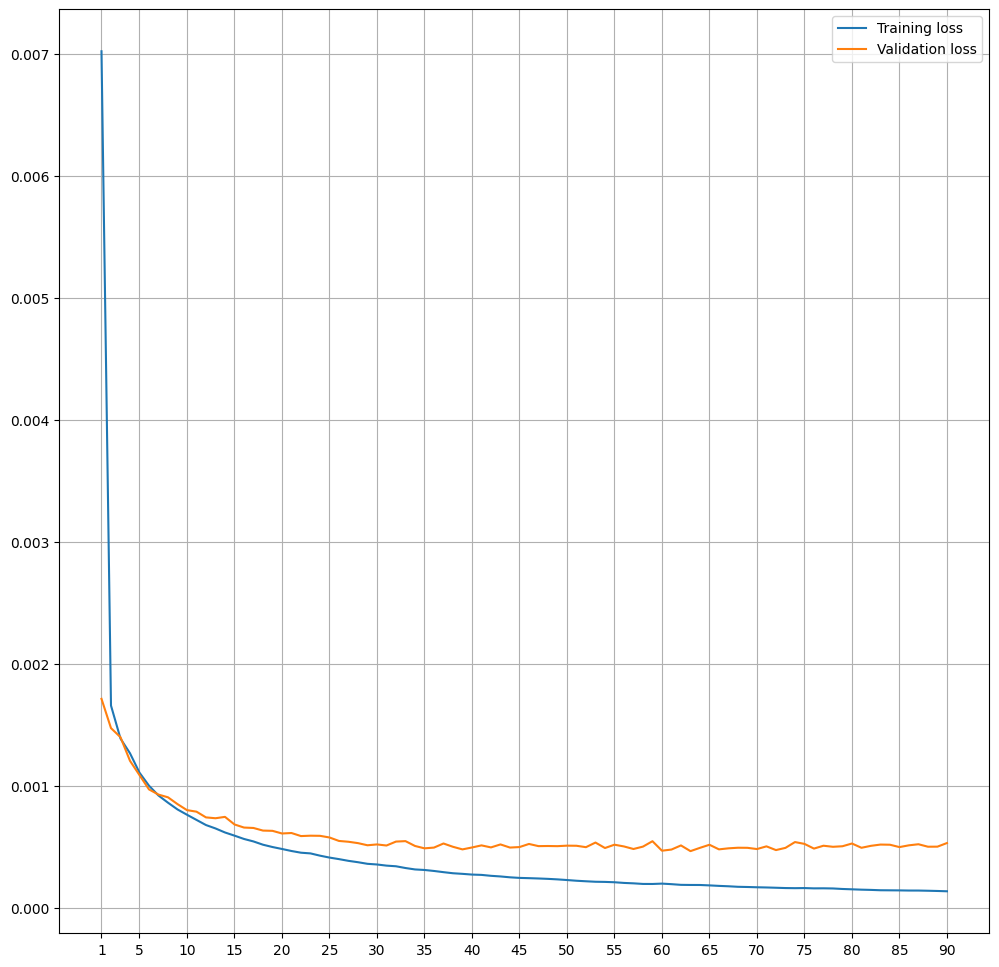

In [48]:
plt.figure(figsize=(12, 12))
plt.plot(np.arange(1,epochs+1), history['train_loss'], label='Training loss')
plt.plot(np.arange(1,epochs+1), history['val_loss'], label='Validation loss')
plt.xticks([1, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90])
plt.grid()
plt.legend()
plt.show()

# Test set evaluation

In [49]:
def test_set_evaluation(models):
    for key, model in models.items():
        with torch.no_grad():
            running_loss = 0
            for i, data in enumerate(test_dataloader):
                img, mask = data
                img, mask = img.to(device), mask.to(device)
                predictions = model(img)
                loss = loss_fn(predictions, mask)
                running_loss += loss.item() * img.size(0)
            loss = running_loss / len(test_dataset)
            
            print(f'Test loss with {key}: {loss}')

In [50]:
test_set_evaluation({"current_model": model})

Test loss with current_model: 0.008252536489016334


In [53]:
torch.save(model.state_dict(), "unet_model.pth")


In [54]:
torch.save(model.state_dict(), "unet_model.pth")

In [55]:
def visualize_segmentation(model, dataloader, num_examples=1):
    model.eval()  

    # Get all indices of the dataset and randomly sample 'num_examples' indices
    dataset_size = len(dataloader.dataset)
    random_indices = random.sample(range(dataset_size), num_examples)

    for idx in random_indices:
        img, mask = dataloader.dataset[idx]  # Access the dataset by index
        img, mask = img.to(device).unsqueeze(0), mask.to(device).unsqueeze(0)  # Add batch dimension

        with torch.no_grad():
            pred = model(img)

        # Squeeze to remove batch and channel dimensions
        img = img.squeeze(0).permute(1, 2, 0).cpu().numpy()  # Convert to HWC format for display
        mask = mask.squeeze(0).squeeze(0).cpu().numpy()
        pred = pred.squeeze(0).squeeze(0).cpu().numpy()
        binary_pred = pred > 0.5

        # Plot
        fig, axes = plt.subplots(1, 4, figsize=(12, 4))
        axes[0].imshow(img, cmap='gray' if img.shape[-1] == 1 else None)
        axes[0].set_title('Input Image')
        axes[0].axis('off')

        axes[1].imshow(mask, cmap='gray')
        axes[1].set_title('True Mask')
        axes[1].axis('off')

        axes[2].imshow(pred, cmap='gray')
        axes[2].set_title('Predicted Mask')
        axes[2].axis('off')

        axes[3].imshow(binary_pred, cmap='gray')
        axes[3].set_title('Binary Predicted Mask')
        axes[3].axis('off')

        plt.tight_layout()
        plt.show()


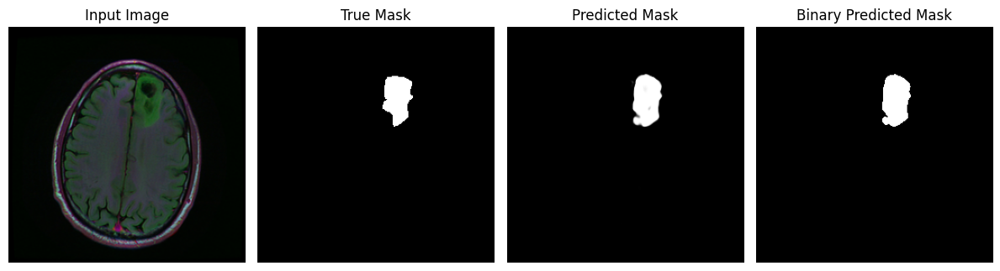

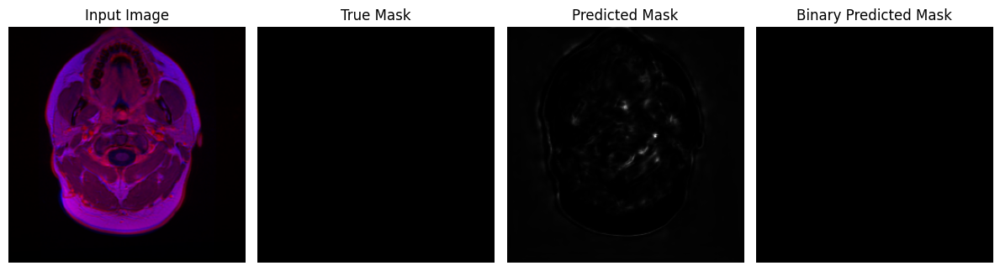

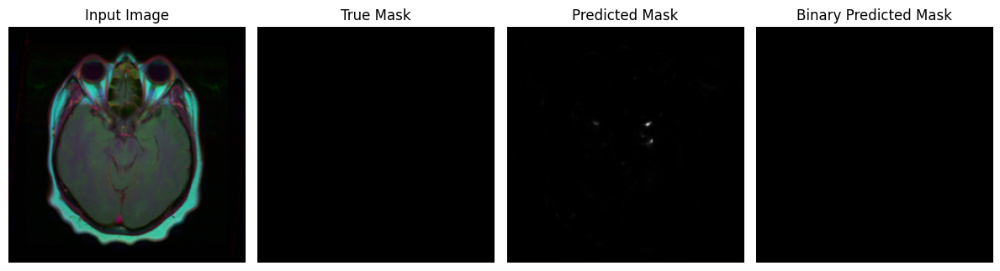

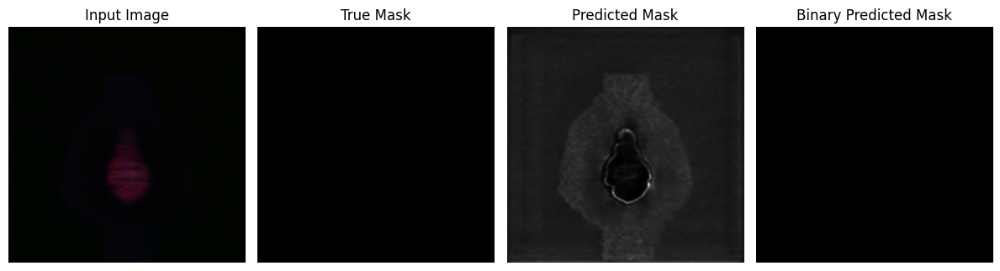

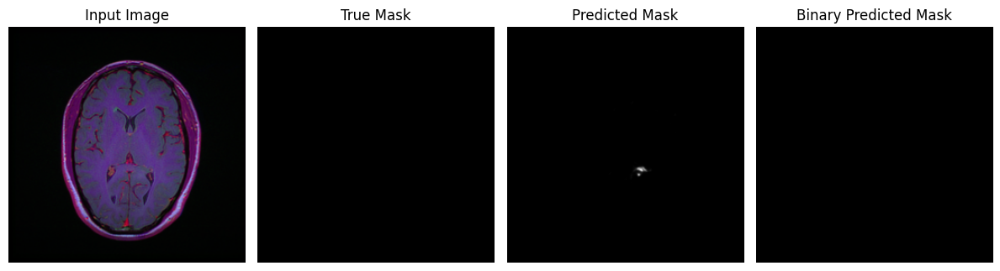

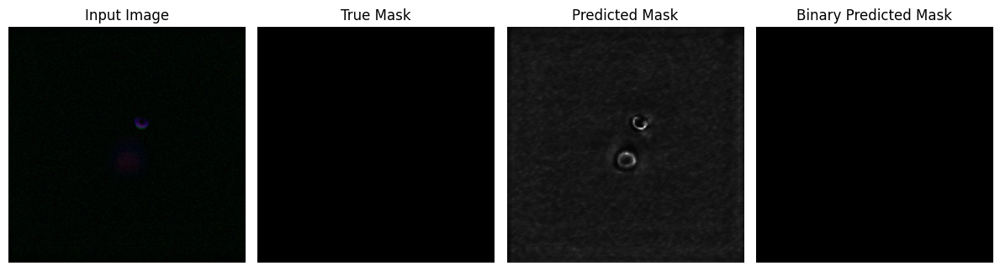

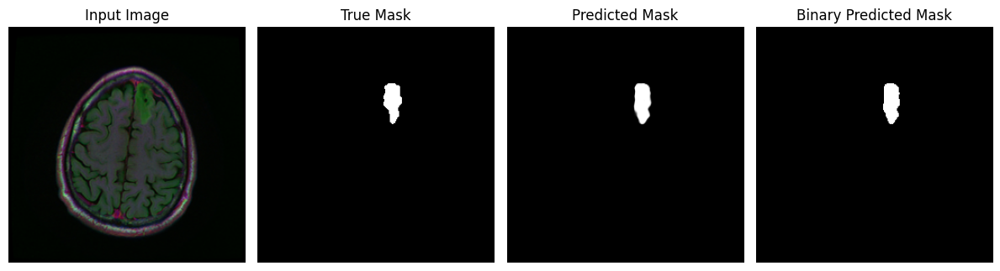

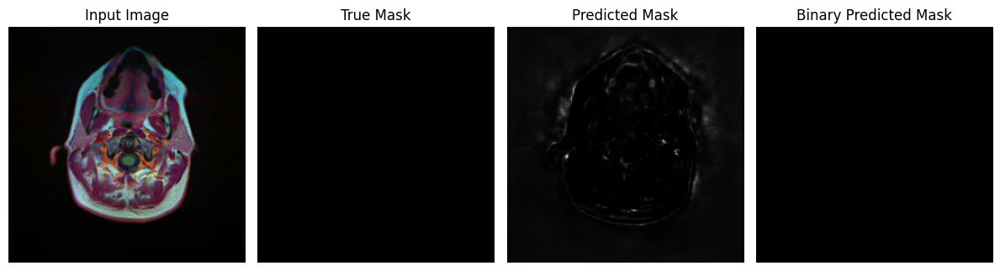

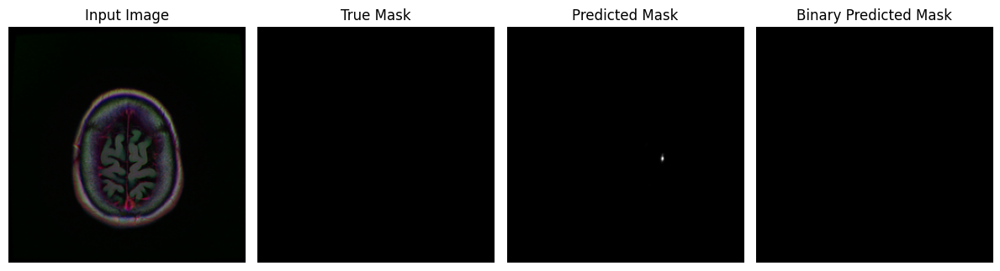

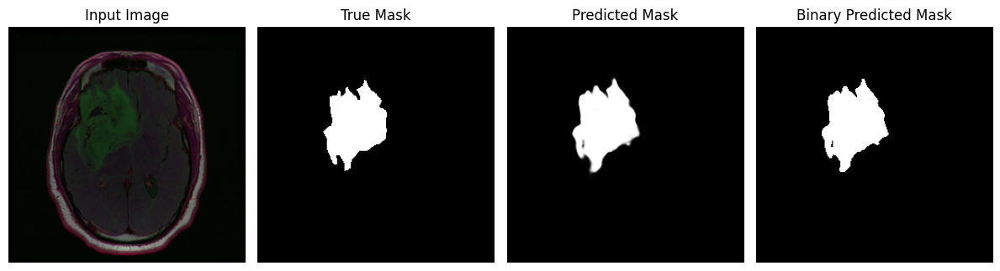

In [56]:
visualize_segmentation(model, test_dataloader, 10)

# Models benchmarking with different epochs

In [60]:
from skimage.segmentation import mark_boundaries

def dice_score(pred, target, epsilon=1e-6):
    """Computes Dice Similarity Coefficient (DSC)."""
    pred = pred > 0.5  # Convert to binary mask
    target = target > 0.5
    
    intersection = np.sum(pred * target)
    return (2. * intersection + epsilon) / (np.sum(pred) + np.sum(target) + epsilon)

def iou_score(pred, target, epsilon=1e-6):
    """Computes Intersection over Union (IoU)."""
    pred = pred > 0.5
    target = target > 0.5
    
    intersection = np.sum(pred * target)
    union = np.sum(pred) + np.sum(target) - intersection
    return (intersection + epsilon) / (union + epsilon)

def visualize_segmentation_new(model, dataloader, num_examples=1, device='cuda:1'):
    model.eval()
    dataset_size = len(dataloader.dataset)
    random_indices = random.sample(range(dataset_size), num_examples)

    for idx in random_indices:
        img, mask = dataloader.dataset[idx]  
        img, mask = img.to(device).unsqueeze(0), mask.to(device).unsqueeze(0)  

        with torch.no_grad():
            pred = model(img)

        # Convert tensors to numpy arrays
        img = img.squeeze(0).permute(1, 2, 0).cpu().numpy()  
        mask = mask.squeeze(0).squeeze(0).cpu().numpy()
        pred = pred.squeeze(0).squeeze(0).cpu().numpy()
        binary_pred = pred > 0.5  

        # Compute Dice and IoU scores
        dice = dice_score(binary_pred, mask)
        iou = iou_score(binary_pred, mask)

        # Normalize image for display
        img = (img - img.min()) / (img.max() - img.min())

        # Convert masks to integer type for mark_boundaries
        mask_int = mask.astype(int)
        binary_pred_int = binary_pred.astype(int)

        # Overlay segmentation boundaries on MRI image
        img_gt_overlay = mark_boundaries(img, mask_int, color=(0, 1, 0))  
        img_pred_overlay = mark_boundaries(img_gt_overlay, binary_pred_int, color=(1, 0, 0))  

        # Plot results
        fig, axes = plt.subplots(1, 5, figsize=(15, 4))
        axes[0].imshow(img, cmap='gray' if img.shape[-1] == 1 else None)
        axes[0].set_title('Input Image')
        axes[0].axis('off')

        axes[1].imshow(mask, cmap='gray')
        axes[1].set_title('True Mask')
        axes[1].axis('off')

        axes[2].imshow(pred, cmap='gray')
        axes[2].set_title('Predicted Mask')
        axes[2].axis('off')

        axes[3].imshow(binary_pred, cmap='gray')
        axes[3].set_title('Binary Predicted Mask')
        axes[3].axis('off')

        axes[4].imshow(img_pred_overlay)
        axes[4].set_title(f'Overlay: GT (Green) & Pred (Red)\nDice: {dice:.4f}, IoU: {iou:.4f}')
        axes[4].axis('off')

        print(dice, iou)
        plt.tight_layout()
        plt.show()


0.8142535326833654 0.686701209035112


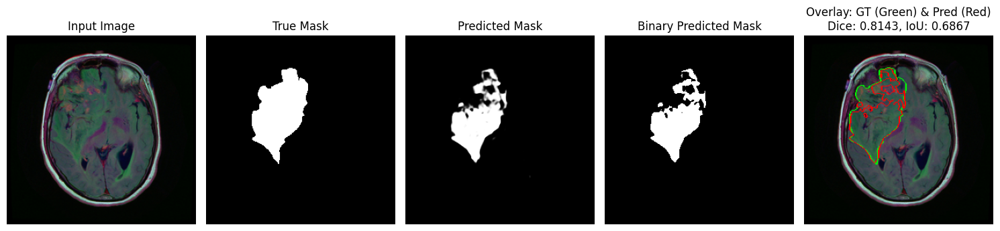

1.0 1.0


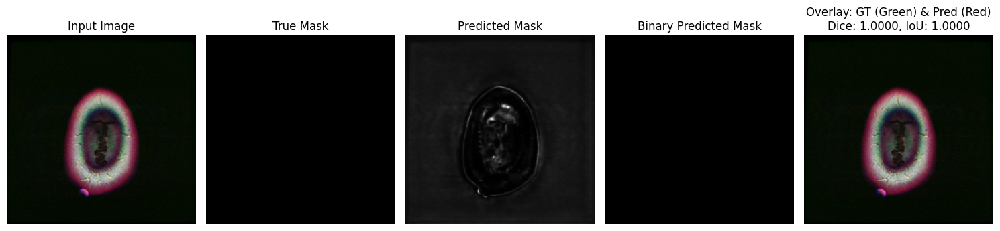

1.0 1.0


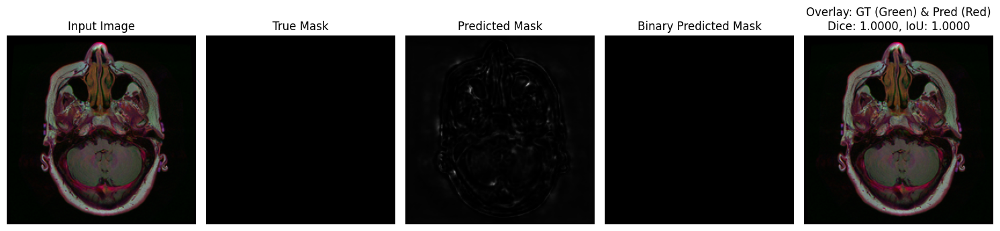

1.0 1.0


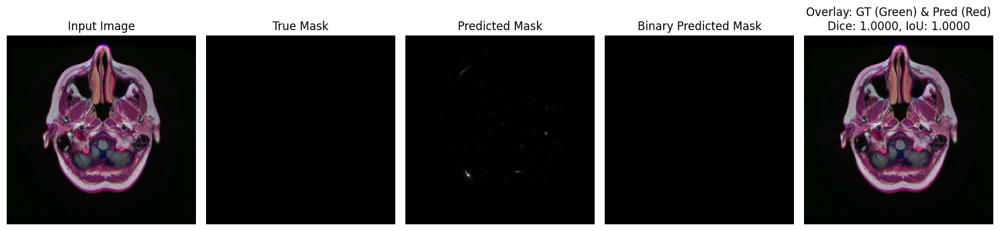

1.0 1.0


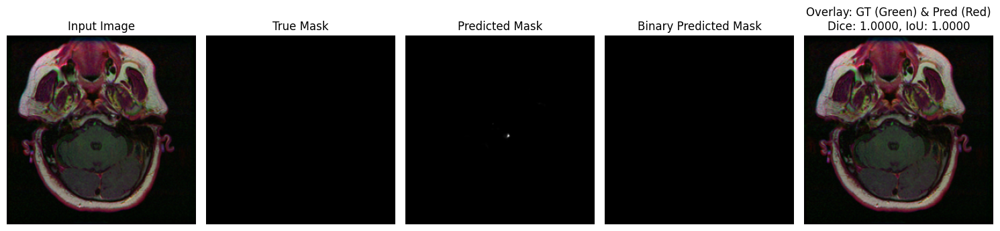

4.166666493055563e-08 4.166666493055563e-08


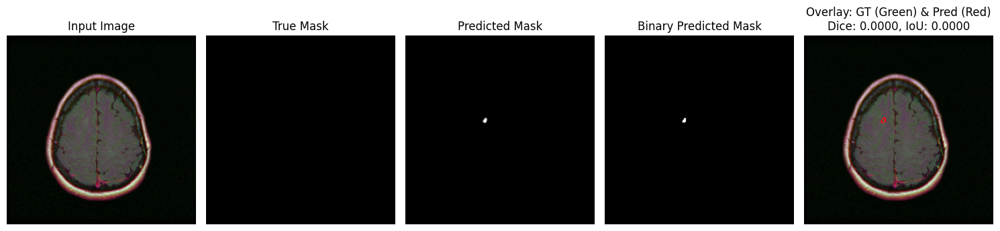

0.9079670330302424 0.83144654109252


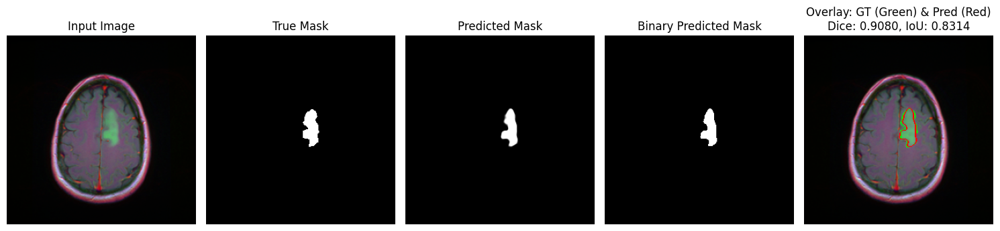

1.0 1.0


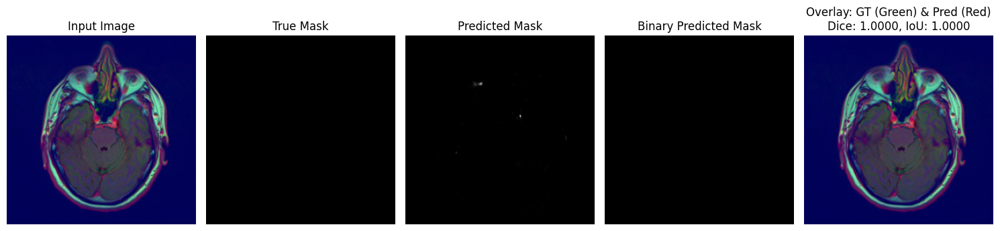

1.0 1.0


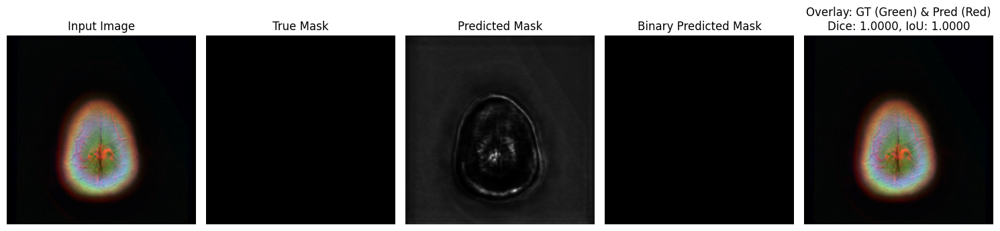

0.9724288840302803 0.9463373083627662


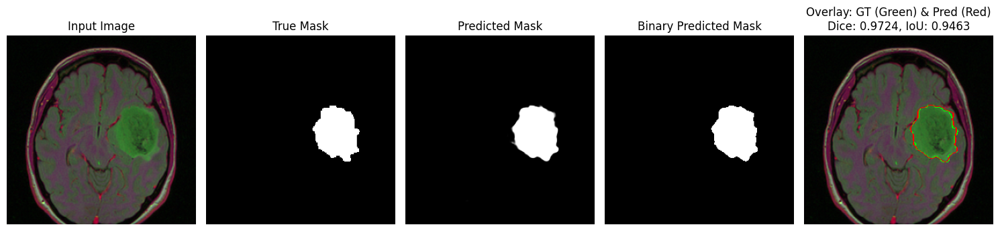

In [61]:
visualize_segmentation_new(model, test_dataloader, 10)